<h1 style="text-align: center; color: purple;" markdown="1">Batting Statistics and Salary in the MLB in 2015.</h1>

<h2 style="text-align: center; color: #012169" markdown="1"> 28 March 2022 </h2>

<h3 style="text-align: center; color: #012169" markdown="1"> Authors: Scott Masterson, Alex McMillen, Matthew Burke </h3>

### Table of Contents 
* [Introduction](#anchor1)
    * [External Data Motivations: key variables at a glance](#anchor20)
* [The Data Set](#anchor2)
    * [Creating, Cleaning, and Manipulating the Data Frames](#anchor2)
    * [Variable Creation](#anchor25)
    * [Visualizations](#anchor50)
* [Methodology/Empirical Model](#anchor5)
* [Conclusion](#anchor9)
* [Sources](#anchor10)

## Introduction <a class = anchor id = anchor1></a>
According to Business Insider, starting pitchers were among the highest earners in the MLB in recent years. These elite pitchers are reliable game-changers that bring consistency to any successful franchise. But what about the hitters? The guys that go out there and get that clutch walk-off home run -- the same guys who steal a crucial base in the bottom of the 8th. These hitters bring notecable value in their position on the field too, be it 3rd base or left field or catcher, but what value can we measure in regard to their hitting stats? The latter raises the research question:
### Which batting statistics result in a higher salary in major league baseball?

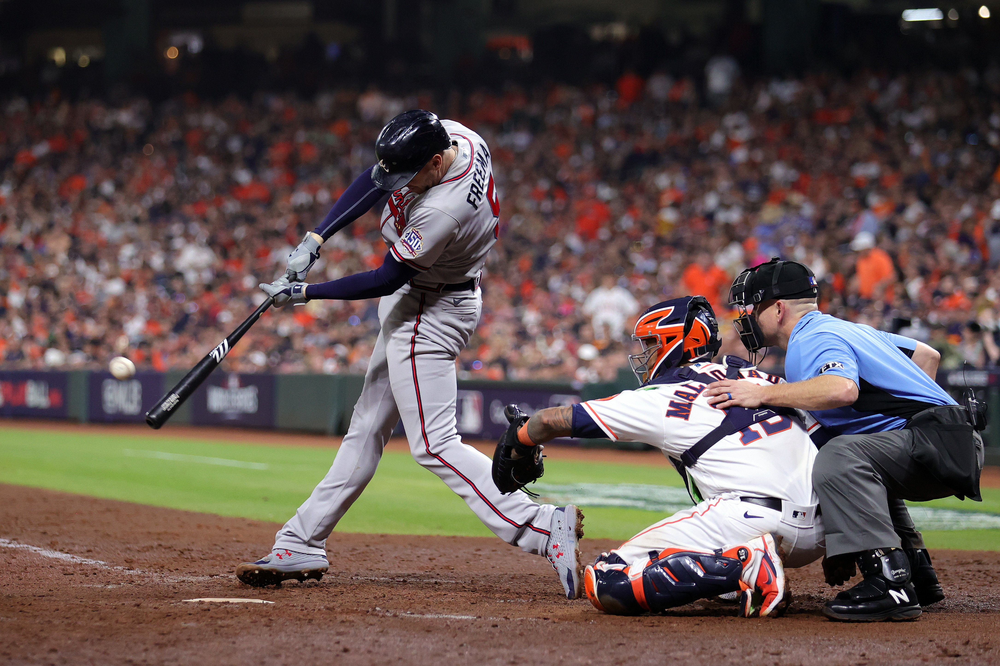

We are interested in this topic of research since several of us in our group grew up playing baseball. Nowadays, we're all student athletes at Emory University. Also, I was a big baseball card collector and I really liked looking for the players with higher stats. I remember how exciting it was back in 2012 when Miguel Cabrera won the Triple Crown by leading the league in batting average, home runs, and runs batted in.

We're curious to see how the three stats included in the Triple Crown (among others) affect how much a player earns in a given season. Since I would argue salary is also a function of how valuable the player is to a team, I would hypothesize that:

* Players who possess higher RBI, home run, stolen bases, or hit stats will make a team more likely to win a game and consequently have a higher salary
* Players who possess higher caught stealing and strike out stats will make a team more likely to lose a game and consequently have a lower salary

(The converse is relevant for each and the variables above may not be the variables examined later in the investigation)

### External Data Motivations: key variables at a glance <a class = anchor id = anchor20></a>
Before jumping into the data set, it's important to understand which stats are sought-after in baseball for winning teams and successful players.

#### Batting Average (BA) and On Base Percentage (OBP)

The article by Bleacherreport titled, "On Base Percentage Vs. Batting Average" takes a deep dive into these two stats. The author argues which stat is better for determining the value a player brings behind the plate, and discusses how the "walk" stat is often overlooked by many. He finalizes the argument by assessing the limitations of using on base percentage which include walks -- hits are more likely to cause RBI, runs, or HR, so both variables are key in understanding the value of different players throughout the major league.

Regarding this investigation, both stats can be used in analysis; however, the data set we have selected does not have either stat included within its current variables so they must be added to the data frame individually using the formulas below:

Batting average:
$$ BA = \frac{Hits}{At Bats}$$ 



On base percentage:
$$ OPB = \frac{Hits + Walks + Hit by Pitch}{At Bats + Walks + Hit by Pitch + Sacrifice Flies}$$



#### Homeruns

The article by a sabermetrics community titled, "Do more home runs mean more wins?" discusses how homeruns are an important factor in analyzing a team's win percentage. The article noted that the teams with higher homeruns often had a higher win percentage, as shown below in this simple linear regression:

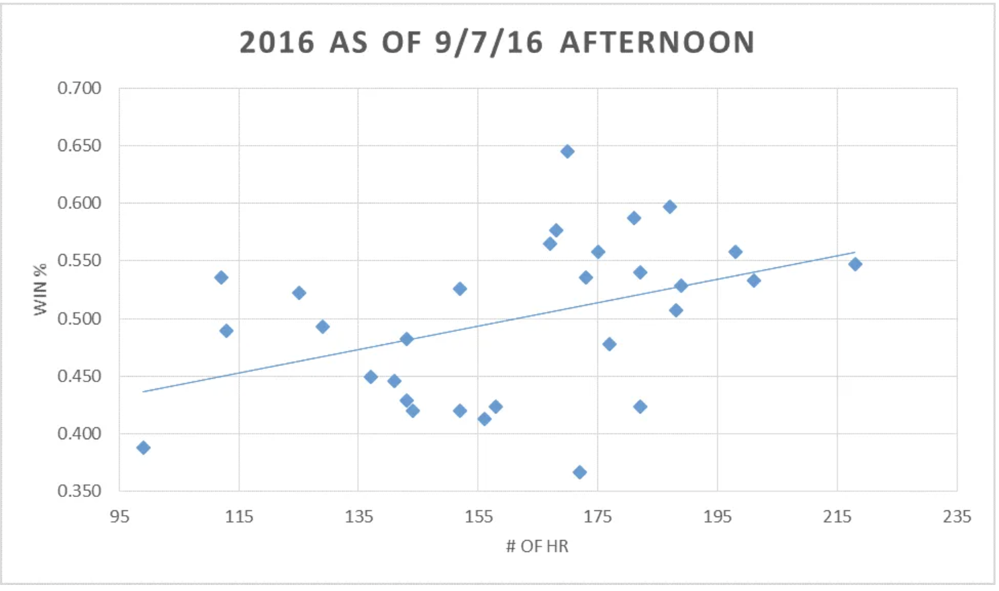

The regression gave an R-Squared value of 0.1752 and a correlation coefficient of 0.418. For some teams, a higher amount of homeruns didn't indicate a higher win percentage and the article mentioned that this could be due to a variety of factors like the team lacking in good starting pitchers or not getting that many runners on base.

For this investigation it may be valuable to see how homeruns affect salary -- it would make sense. Homeruns not only win games, but they're exciting and keep the crowd engaged. It's logical to assume that players who have high amounts of homeruns would have a higher salary since they're directly contributing to the team's success and ticket sales.

## The Data Set <a class = anchor id = anchor2></a>
We sourced the data set from seanlahman.com under the baseball archive (see sources). Originally we planned to use a smaller, outdated data set from Rutgers which was in a cleaner, more managable form than this new data set; however, that data set possessed limitations with it's age and also it's lack of variables to examine. 

The data set we are using now contains a variety of interesting variables to be included in our analysis and more current statistics. The data set is a census of every baseball player in the MLB from 1871 to 2020, but we will be focusing on the year 2015 to ensure the data is cross-sectional. We selected this year using a random number generator from years 2000 to 2015. We didn't want to select years before 2000 to keep the data more current and we wanted to randomize our selection since we were indecisive about which year to select and it ultimately doesn't matter for the analysis we plan to perform.  

In [8]:
# Import necessary packages here
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import wooldridge as woo
import statsmodels.formula.api as smf
import scipy.stats as stats
from IPython.core.display import HTML
import zipfile
from scipy.stats import t
from stargazer.stargazer import Stargazer

# file path from computer
import os
path = os.getcwd()
print(path) 
print(type(path))

import warnings
warnings.filterwarnings("ignore")

# plotly installed to make graphs more interactive
import plotly.express as px

C:\Users\mattb\Desktop\baseballSalary
<class 'str'>


In [33]:
#read multiple zip files
batting = pd.read_csv(open('Batting.csv'))
salary = pd.read_csv(open('Salaries.csv'))

## Creating, Cleaning, and Manipulating the Data Frames <a class = anchor id = anchor2></a>
The two CSV files will be independently filtered by observation then merged together, the comments within the code discuss this in greater detail.

In [10]:
#select relevant year and variables from salary
salary2015_1 = salary[(salary['yearID'] == 2015)]
salary2015 = salary2015_1[["playerID", "salary"]]
salary2015.info()

print(" ")

#construct dataframe for batters
batters2015_1 = pd.merge(batting, salary2015, on = "playerID")
batters2015_2 = batters2015_1[(batters2015_1['yearID'] == 2015)]

#select for "contributing" players (players who have had 25 or more at bats)
batters2015_3 = batters2015_2[(batters2015_2['AB'] >= 25)]

#for whatever reason the 3B and 2B wouldn't work properly when running the regression so they're being renamed below
batters2015 = batters2015_3.rename(columns = {'2B': 'double', 
                                              '3B': 'triple'})
#check variables
batters2015.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 817 entries, 24758 to 25574
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   playerID  817 non-null    object
 1   salary    817 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 19.1+ KB
 
<class 'pandas.core.frame.DataFrame'>
Int64Index: 509 entries, 20 to 8849
Data columns (total 23 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   playerID  509 non-null    object 
 1   yearID    509 non-null    int64  
 2   stint     509 non-null    int64  
 3   teamID    509 non-null    object 
 4   lgID      509 non-null    object 
 5   G         509 non-null    int64  
 6   AB        509 non-null    int64  
 7   R         509 non-null    int64  
 8   H         509 non-null    int64  
 9   double    509 non-null    int64  
 10  triple    509 non-null    int64  
 11  HR        509 non-null    int64  
 12  RBI       509 non-null    f

### Variable Investigation
In this section we will assess the strengths and weakenesses of each variable that may be relevant to our investigation. From there we will select variables to use in the regression under the methodology section.

In [11]:
#view descriptive statistics for each variable
batters2015.describe()

,yearID,stint,G,AB,R,H,double,triple,HR,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP,salary
count,509.0,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,509.000000,5.090000e+02
mean,2015.0,1.100196,87.015717,278.719057,34.968566,71.510806,14.025540,1.518664,8.367387,33.483301,4.237721,1.791749,24.108055,60.805501,1.730845,2.748527,1.701375,2.161100,6.451866,5.202909e+06
std,0.0,0.325703,47.803277,194.299179,28.925627,55.716507,11.429574,2.068261,9.324033,28.933575,7.339119,2.519188,22.264474,41.679451,3.045626,3.531582,2.419820,2.330384,5.933700,5.968296e+06
min,2015.0,1.000000,6.000000,25.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.075000e+05
25%,2015.0,1.000000,38.000000,89.000000,9.000000,18.000000,4.000000,0.000000,1.000000,7.000000,0.000000,0.000000,6.000000,25.000000,0.000000,0.000000,0.000000,0.000000,2.000000,5.305000e+05
50%,2015.0,1.000000,86.000000,233.000000,28.000000,59.000000,12.000000,1.000000,5.000000,27.000000,1.000000,1.000000,19.000000,51.000000,1.000000,2.000000,1.000000,1.000000,5.000000,2.505000e+06
75%,2015.0,1.000000,132.000000,445.000000,56.000000,116.000000,22.000000,2.000000,12.000000,52.000000,5.000000,3.000000,35.000000,91.000000,2.000000,4.000000,3.000000,3.000000,10.000000,7.800000e+06
max,2015.0,3.000000,162.000000,638.000000,122.000000,205.000000,45.000000,12.000000,47.000000,130.000000,58.000000,20.000000,143.000000,208.000000,29.000000,30.000000,14.000000,11.000000,28.000000,3.257100e+07


At a glance, there are a variety of variables from which to focus upon. It'll be difficult to tell which variables will have a notiecable effect on our dependent variable without testing (which will be done in a later section), but we can do some preliminary analysis using correlation. We've constructed a correlation matrix for all variables in the dataset and transformed it into a heatmap. The heatmap allows us to visualize which variables are most/least correlated with one another and with the variable of interest, salary.

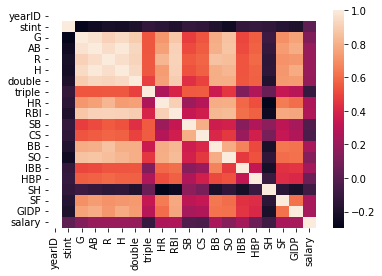

In [12]:
corrMatrix = batters2015.corr()
sns.heatmap(corrMatrix);

Stint and yearID have been removed just for the purpose of display in this heatmap.

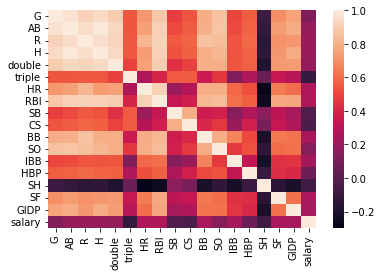

In [13]:
removelist = ['stint', 'yearID']
batters2015_2 = batters2015.drop(removelist, axis = 1)
corrMatrix2 = batters2015_2.corr()
sns.heatmap(corrMatrix2);

In the top left corner, the variables appear to be heavily correlated with one another. On the far right column (or bottom row) we can see how each variable is correlated with salary. It appears that most of the variables are only slighlty positvely correlated or even negatively correlated with salary. Negative correlation would make sense for variables like strikeout or caught stealing, but I would have expected to see games or hits have more of a positive relationship with salary.

### Variable Creation <a class = anchor id = anchor25></a>
Creation of batting average and on base percentage as variables in the data set. As mentioned in the external data motivation section, we believe the two stats are useful when expressing a player's value to a winning team and therefore may be indicators of wage. We can examine this further in the methodology section.

In [14]:
#note that BB is the same as walks:
OBP = (batters2015['H']+batters2015['BB']+batters2015['HBP'])/(batters2015['AB']+batters2015['BB']+batters2015['HBP']+batters2015['SF'])
battingstats = batters2015_2
battingstats['OBP'] = OBP

#add batting average variable
BA = batters2015['H']/batters2015['AB']
battingstats['BA'] = BA

#np.log(salary) variable for use in plots
log_salary = np.log(batters2015['salary'])
battingstats['log_salary'] = log_salary
battingstats.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 509 entries, 20 to 8849
Data columns (total 24 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   playerID    509 non-null    object 
 1   teamID      509 non-null    object 
 2   lgID        509 non-null    object 
 3   G           509 non-null    int64  
 4   AB          509 non-null    int64  
 5   R           509 non-null    int64  
 6   H           509 non-null    int64  
 7   double      509 non-null    int64  
 8   triple      509 non-null    int64  
 9   HR          509 non-null    int64  
 10  RBI         509 non-null    float64
 11  SB          509 non-null    float64
 12  CS          509 non-null    float64
 13  BB          509 non-null    int64  
 14  SO          509 non-null    float64
 15  IBB         509 non-null    float64
 16  HBP         509 non-null    float64
 17  SH          509 non-null    float64
 18  SF          509 non-null    float64
 19  GIDP        509 non-null   

We realized the dataset we chose did not have a stat for the players' batting averages so we created this variable and added it the dataframe as another independent variable which is shown in the output above. Also, a log_salary variable has been constructed using numpy for facilitated implementation later on. Using the logarithm of salary makes sense to account for outliers and it leads to more appealing visualiztion.

#### Creating some Categorical Variables to be Used in Visualizations and Further Analysis
Using games (G) to slice up the data into two categories: "Plays Infrequently" and "Plays Frequently." Plays Infrequently includes all batters who played 6 (min) to 86 (median) games, and Plays Frequently includes all batters from 87 to 162 games

In [15]:
#cut at logical points so the groups are relatively even
cuts = [battingstats['G'].min(), battingstats['G'].median(), battingstats['G'].max()] 
labs = ['Plays Infrequently', 'Plays Frequently']

## cut at median of 86 games

battingstats['G_cat'] = pd.cut(battingstats['G'], bins = cuts, labels = labs)
battingstats['G_cat'].value_counts()

Plays Infrequently    256
Plays Frequently      252
Name: G_cat, dtype: int64

The same approach is used below but with the at bats (AB) variable.

In [16]:
#cut at logical points so the groups are relatively even
cuts1 = [battingstats['AB'].min(), battingstats['AB'].median(), battingstats['AB'].max()]
labs1 = ['Bats Infrequently', 'Bats Frequently']

## cut at median of 233 AB

battingstats['AB_cat'] = pd.cut(battingstats['AB'], bins = cuts1, labels = labs1)
battingstats['AB_cat'].value_counts()

Bats Frequently      254
Bats Infrequently    252
Name: AB_cat, dtype: int64

### Visualizations <a class = anchor id = anchor50></a>
A few graphs will help us in selecting which variables will be the most interesting to examine in our analysis. While some of the first few graphs don't help us directly visualize salary initially, seeing the distribution of individual explanatory variables is useful for further analysis.

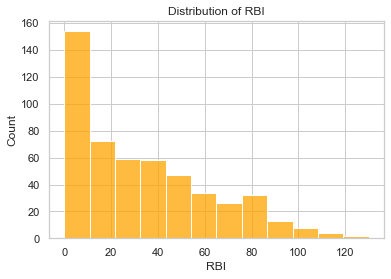

In [17]:
#construct plot using seaborn
sns.set_theme(style="whitegrid");

sns.histplot(x = "RBI", 
           data = battingstats,
           color = 'orange' );

plt.xlabel("RBI")
plt.title("Distribution of RBI")
plt.show()

The distribution of RBIs is skewed right and not symetric.  This is unsurprising, as the majority of players would only have < 20 RBI's due to lack of playing time while the few "star players" have as much as 100 RBI's or even more.

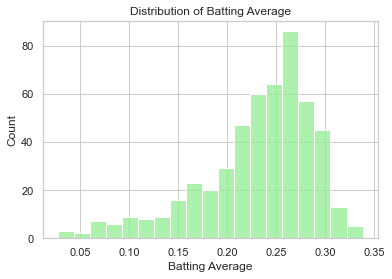

In [18]:
#construct plot using seaborn
sns.set_theme(style="whitegrid");

sns.histplot(x = "BA", 
           color = 'lightgreen',
           data = battingstats);

plt.xlabel("Batting Average")
plt.title("Distribution of Batting Average")
plt.show()

The distribution of batting average is skewed left and not symmetric.  The batting average with the highest frequency is approximately 0.265 while the majority of batting averages fall somewhere between 0.2 and 0.3. 

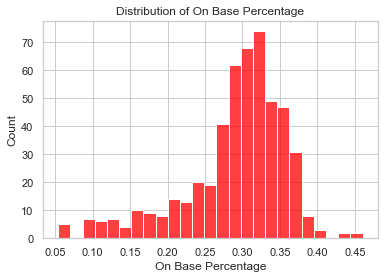

In [19]:
sns.set_theme(style="whitegrid");
sns.histplot(x = "OBP", 
           color = 'red',
           data = battingstats);

plt.xlabel("On Base Percentage")
plt.title("Distribution of On Base Percentage")
plt.show()

Similar to the distribution of batting average, the distribution for OBP is skewed left (though maybe slightly less) and not symmetric.  As one would expect, the highest frequency for OBP is higher than that for batting average (average is only hits while OBP also includes walks, HBP, fielder's choice, etc.), falling at approximately 0.325.  The majority of observations fall between approximately 0.275 and 0.365, which is also higher than that for batting average.

#### Coloring by Salary: Interesting Findings in the Data
After reviewing several variables above separate from salary, more complex plots including our dependent variable can help motivate the methodology section that follows.

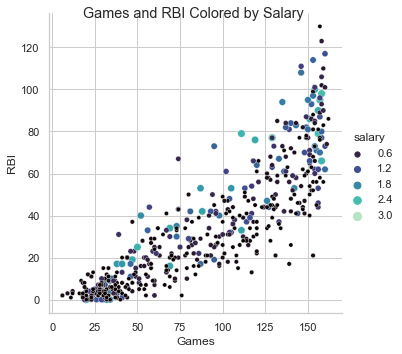

In [20]:
g1 = sns.relplot(x = 'G', y = 'RBI',
            data = battingstats,
            hue = 'salary',
            size = 'salary',
            palette = 'mako');

g1.fig.suptitle("Games and RBI Colored by Salary");
g1.set(xlabel = "Games");

This graph shows that RBI's are strongly positively correlated with games.  These findings are unsurprising for two reasons.  First, if a player is in more games then they get more oppurtunities (AB's) to score runners.  Second, better players are more likely to get an RBI at any given AB, and better players tend to play more games. Regarding salary which is expressed in millions of US Dollars, it appears that darker-colored dots (which indicate a lower salary) lie closer to the origin, but all types of dots are spread out amidst this scatterplot.

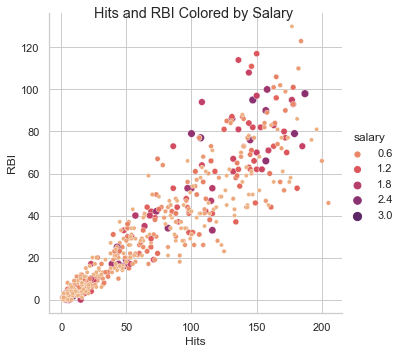

In [21]:
g2 = sns.relplot(x = 'H', y = 'RBI',
            data = battingstats,
            hue = 'salary',
            size = 'salary',
            palette = 'flare');

g2.fig.suptitle("Hits and RBI Colored by Salary")
g2.set(xlabel = "Hits");

This graph shows that RBI's are very strongly positively correlated with hits.  Obviously this is unsuprising, as the more hits a player has, the more likely it is that they got a hit while a runner was in scoring position, thus getting an RBI. Again regarding salary which is expressed in millions of US Dollars, it appears that more lightly-colored dots (which indicate a lower salary) lie closer to the origin.

#### Plotly Graphs for Further Investigation and Interactivity
Plotly allows the user to hover over different parts of the graph and view metrics at each different observation. 

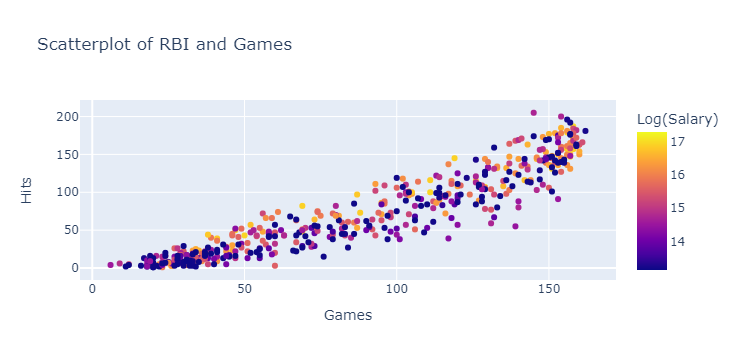

In [22]:
#plotly scatterplot
scatter1 = px.scatter(battingstats, y="H", x="G", color = 'log_salary',
                   labels = {
                     "H": "Hits",
                     "G": "Games",
                     "log_salary": "Log(Salary)",                        
                    },
                   title= "Scatterplot of RBI and Games",)
scatter1.show()

This scatterplot shows that typically as the amount of games increases, so does the amount of hits. This is valuable since it supports the common theme that generally the more games played, the higher the other stats will likely be. While the different colors of log(salary) dots are scattered thoroughly throughout the scatterplot, darker dots (lower salary) tend to be concentrated more toward the origin.

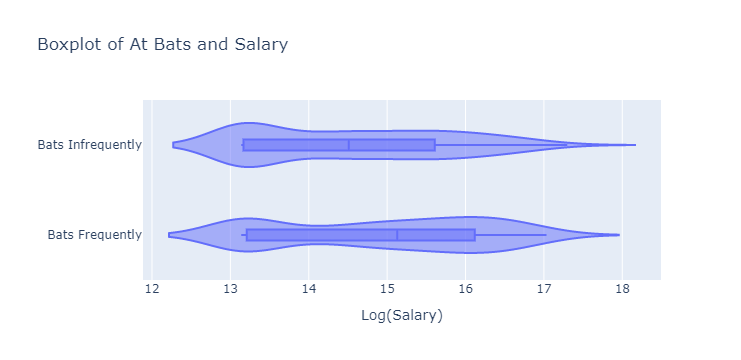

In [23]:
#construct plot using plotly
box1 = px.violin(battingstats, y = "AB_cat", x = "log_salary",
                   box = True, # including box to see median and quartiles more easily
                   labels = {
                     "AB_cat": "",
                     "log_salary": "Log(Salary)",
                    },
                   title= "Boxplot of At Bats and Salary")

box1.show()

From this graph, we can see that there is not a significant difference between the distribution of salary between players who bat frequently vs those who bat infrequently.  The log(salary) variable is clustered around a value just greater than 13 for both distributions, but this observation is slightly more pronounced for those players who bat frequently.  The log(salary) variable is also slightly clustered around a value of 16 for those who bat infrequently, but this observation is hardly noticeable for those who bat frequently.  

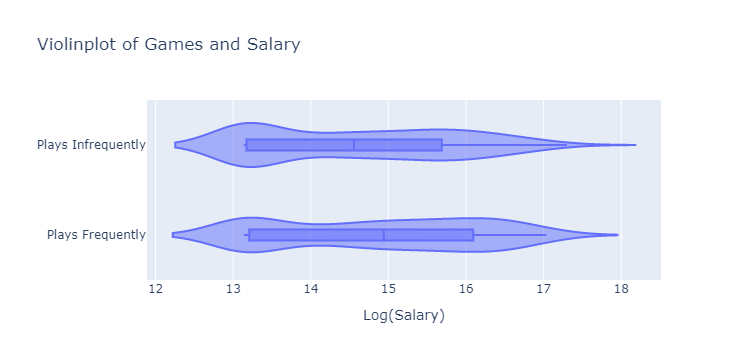

In [24]:
violin1 = px.violin(battingstats, y = "G_cat", x = "log_salary",
                   box = True,
                   labels = {
                     "G_cat": "",
                     "log_salary": "Log(Salary)",
                    },
                   title= "Violinplot of Games and Salary")
violin1.show()

This visual is rather similar to the one previously and this could be due to the fact that both the games and at bats variables have to do with the frequency for which one plays. Like the graph before, the median log(salary) for those who fall into the category "Plays Frequently" is slighlty higher than the median log(salary) for players who fall into the category "Plays Infrequently."

## Methodology/Empirical Model <a class = anchor id = anchor5></a>
In this section we will utilize the variables we have selected based on our research and correlation matrices. We will construct severl regression models like the one shown below:

$$ log(salary) = \beta_0 + \beta_1*RBI + \beta_2*BA + \beta_3*SB + \beta_4*H + u $$

The following regression motivates this section and the results section which are to be completed for the final portion of this investigation. The model which includes all variables of interest is shown below:

In [30]:
reg = smf.ols(formula = 'np.log(salary) ~ G + AB + R + H + double + triple + HR + RBI +'
              'SB + CS + BB + SO + IBB + HBP + SH + SF + GIDP', data = battingstats)
results1 = reg.fit()

# print results using summary:
print(f'results.summary(): \n{results1.summary()}\n')

results.summary(): 
                            OLS Regression Results                            
Dep. Variable:         np.log(salary)   R-squared:                       0.198
Model:                            OLS   Adj. R-squared:                  0.170
Method:                 Least Squares   F-statistic:                     7.138
Date:                Tue, 24 May 2022   Prob (F-statistic):           1.17e-15
Time:                        14:17:38   Log-Likelihood:                -795.12
No. Observations:                 509   AIC:                             1626.
Df Residuals:                     491   BIC:                             1702.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     14.8941      0.134

*stargazer was not used for this OLS output since the amount of variables resulted in a distracting display due to the length of the stargazer output. Stargazer will be used later in the investigation. 

From the OLS summary table we can see that there are very few variables that are significant predictors of salary.  Surprisingly, there is very little positive correlation between stats such as homeruns, RBI's, and extra base hits (doubles and triples) with salary.  The few variables that appear to have a significant effect on salary are games, at bats, and triples (though this is suprisingly a negative correlation). To further evaluate the selected variables, we have found the confidence intervals as shown below:

In [26]:
results1.conf_int()

,0,1
Intercept,14.631193,15.157068
G,-0.030560,-0.012456
AB,0.002032,0.012397
R,-0.020082,0.020371
H,-0.020092,0.011300
double,-0.037859,0.019431
triple,-0.192802,-0.051218
HR,-0.027764,0.051111
RBI,-0.018529,0.020651
SB,-0.036131,0.016863


Notice that almost all of the confidence intervals constructed for each variable contain 0. This means that there is a good chance of finding no correlation between some of the variables and our dependent variable. Finding zero in the interval could also mean that we have uncertainty about whether there is a treatment effect. According to the table, there are only a few variables with confidence intervals that don't contain zero:

* Games (G)
* At bats (AB)
* Base on balls or walks (BB)
* Triple

Below we have computed some t stats and obtained p values for variables with confidence intervals that contain zero.

In [28]:
#T-Stat for reg with variables that have conf int that contain zero
b = results1.params
se = results1.bse
df = results1.nobs-17-1

data = [] # empty string to be used in table construction
stats_to_test = ['R', 'H', 'double', 'HR', 'RBI', 'SB', 'CS', 'SO', 'IBB', 'HBP', 'SH', 'SF', 'GIDP'] 
for stat in stats_to_test: # computed t stat and p val for each variable in array stats_to_test 
    b_stat = b[stat]
    se_stat = se[stat]
    tstat = b_stat/se_stat
    pval = 2*stats.t.cdf(-abs(tstat), df)
    data.append([stat, abs(tstat), pval])
    
#cv_t = stats.t.ppf(1-.05/2,df) #conputing t stat example
#print(f'cv_t: {cv_t}\n')

#organize and construct table for more effective viewing
tstats = pd.DataFrame(data)
tstats = tstats.rename(columns = {0:'Player Stat', 1:'T-Stat', 2:'P-Val'}) 
tstats = tstats.reset_index(drop=True)
tstats

,Player Stat,T-Stat,P-Val
0,R,0.014034,0.988808
1,H,0.550301,0.582363
2,double,0.632008,0.527676
3,HR,0.581594,0.561107
4,RBI,0.106414,0.915297
5,SB,0.714401,0.475319
6,CS,0.139273,0.889292
7,SO,1.701326,0.089515
8,IBB,0.826387,0.408986
9,HBP,0.918727,0.358689


Not suprisingly, almost all of the variables don't have a p value of significance at common values of alpha -- which supports the evidence found from the confidence intervals. In order to determine the significance of the above variables, we ran a T-test with the null hypotheses $H_0: \beta_i=0$. As we can see, none of these variables are significant predictors of salary at the alpha value of 0.05.  Oddly, SO's have the lowest p-value at approximately 0.09, which is significant at the alpha value of 0.1. Therefore, we fail to reject the null hypothesis that these variables are zero.

Below we have computed the t stats and p values for the variables with confidence intervals that don't contain zero.

In [29]:
#T-Stat for reg with variables that have conf int that do not contain zero
b = results1.params
se = results1.bse
df = results1.nobs-17-1

data = [] # empty string to be used in table construction
stats_to_test = ['G', 'AB', 'BB', 'triple'] 
for stat in stats_to_test: # computed t stat and p val for each variable in array stats_to_test 
    b_stat = b[stat]
    se_stat = se[stat]
    tstat = b_stat/se_stat
    pval = 2*stats.t.cdf(-abs(tstat), df)
    data.append([stat, abs(tstat), pval])
    
#cv_t = stats.t.ppf(1-.05/2,df) #conputing t stat example
#print(f'cv_t: {cv_t}\n')

#organize and construct table for more effective viewing
tstats = pd.DataFrame(data)
tstats = tstats.rename(columns = {0:'Player Stat', 1:'T-Stat', 2:'P-Val'}) 
tstats = tstats.reset_index(drop=True)
tstats

,Player Stat,T-Stat,P-Val
0,G,4.668507,0.000004
1,AB,2.735220,0.006459
2,BB,2.521149,0.012013
3,triple,3.386364,0.000765


The four stats above all render p values that are significant as to reject the null hypothesis that $H_0: \beta_i=0$, for common values of alpha: G has a p value far below 0.05 for example. It would make sense that these stats would affect salary in a noticable way: the more games a player plays, the more liekly they're a starter and a contributing member of the team -- this is probably true for at bats as well. Furthermore, having a high amount of base on balls is indicative of an experienced, patient hitter and triples are rare and may only come from the most experienced batters.

These findings lead us to construct another regression model which includes these four variables:

$$ log(salary) = \beta_0 + \beta_1*G + \beta_2*AB + \beta_3*triple + \beta_4*BB + u $$

In [32]:
reg2 = smf.ols(formula = 'np.log(salary) ~ G + AB + triple + BB', data = battingstats)
results2 = reg2.fit()
st = Stargazer([results2])
from IPython.core.display import HTML
st.title("Variables of Statistical Significance")
st.covariate_order(['G', 'AB', 'triple', 'BB', 'Intercept'])
HTML(st.render_html())

Removing the variables that proved to be insignificant, we are left with the above regression model for log(salary). As we can see G and AB appear to have little effect on the variance of salary, however triples accounts for almost 17% of the variance in log(salary).

In [ ]:
n = battingstats.shape[0]
reg_r = smf.ols(formula = 'np.log(salary) ~ G + AB + triple + BB', data = battingstats).fit()
r2_r = reg_r.rsquared

reg_ur = smf.ols(formula = 'np.log(salary) ~ G + AB + R + H + double + triple + HR + RBI +'
              'SB + CS + BB + SO + IBB + HBP + SH + SF + GIDP', data = battingstats).fit()
r2_ur = reg_ur.rsquared

fstat = (r2_ur-r2_r)/(1-r2_ur)*(n-18)/2
print(f'fstat: {fstat}\n')

cv = stats.f.ppf(1-.05, 12, df)
print(f'cv: {cv}\n')
#From this F-stat, we know the variables are not jointly significant in the model

Lastly, we ran an F-test to determine the joint significance of the variables in the final model, with the null hypothesis $H_0: \beta_1=\beta_2=\beta_3$.  Thus, since the F value is larger than the critical value, we fail to reject the null hypothesis.

#### Examining Batting Average and On Base Percentage
As outlined in the motivation section, these two variables are of high interest to explain the dependent varibale salary so they will be examined in this individual section using stargazer.

$$ log(salary) = \beta_0 + \beta_1*BA + \beta_2*OBP + u $$

It make sense to include OBP in the regression because it's an effective measure of a baseball player's expertise when batting; they know when to swing and when not to, it's not just related to hits like the article in the introduction section mentioned. This is under the assumption that a higher on base percentage is more valuable to the player and therefore the baseball team -- it would make sense for the variable to have a positive effect on salary.

In [ ]:
#batting average and on base percentage
reg3 = smf.ols(formula = 'np.log(salary) ~  BA', data = battingstats).fit()
reg4 = smf.ols(formula = 'np.log(salary) ~  OBP', data = battingstats).fit()
reg5 = smf.ols(formula = 'np.log(salary) ~  BA + OBP', data = battingstats).fit()

st = Stargazer([reg3, reg4, reg5])
from IPython.core.display import HTML
st.title("Batting Average and On Base Percentage")
st.rename_covariates({'BA' : 'Batting Average',
                     'OBP' : 'On Base Percentage'})
st.covariate_order(['BA', 'OBP', 'Intercept'])
HTML(st.render_html())

From the table we can see that OBP is more strongly correlated with salary than average (a coefficient of around 2 for OBP vs a coefficinet of around 1 for average). From this we see that BA affect salary more than OBP when alone in the model. Interestingly enough when we put them in the same model, OBP affects salary more.

## Conclusion <a class = anchor id = anchor9></a>

In this study, our primary objective was to determine which batting stats were most strongly correlated with an increase in salary for baseball players.  To achieve this, we first singled out the year 2015 to obtain cross-sectional data and then filtered out players with less than 25 at bats to avoid any outliers (such as a player who was being payed 20 million dollars a year but got injured after his second game).  

The three stats that we were most interested in and expected to be most strongly positively correlated with salary were batting average (BA), on base percentage (OBP), and homeruns (HR).  To our surprise, all three of these variables were only slightly correlated with salary, and none of them were found to be significant predictors of salary (p-value < 0.05).  Instead, what we found was that the only two variables that were significantly correlated with salary were games played and at bats.  It makes sense that games played and at-bats are positively correlated with salary, as better players, who get payed more, are likely going to be a starting player for their team.  Despite this, we are still unsure why these two stats were the only significant predictors of salary, as the same logic would apply to stats such as homeruns.  

To improve this investigation it may have been useful to include position as a variable in the analysis; however, the data set we used did not have the variable easily-accessible. I planned on joining another dataset which included players' positions, but I ran into a major problem: observations between datasets often had multiple positions listed which resulted in replication of observations when joining. It would be bad statistical practice to omit certain position duplicates without sound evidence, so the issue was avoided altogether. I recently learned that wooldridge offers a MLB dataset with salaries and many other stats similar to those within this dataset. I would be curious to see if that dataset more cleanly inegrates a player's position since I believe position is inseparably correlated with salary after seeing the results of this investigation, or lacktherof. 

One of the biggest caveats of this study is that we only chose the year 2015 to investigate.  It is entirely possible that if we were to choose a different year, or include multiple other years in addition to 2015, that we would find different results (although this might not be true).  Additionally, we filtered on players with greater than 25 at bats.  If we chose to include all players, or we chose to include only players with greater than 100 at bats, it is very likely that we would have obtained different results.  These issues could easily be solved by running the same study as above multiple times while including these differnet specifications.  For example, we could run the same study but with players from the year 1995, or with players from the 1970's.  Additinally we could run the same study but with all players regardless of the number of at bats, or with only players who have greater than 100 at bats.

## Sources <a class = anchor id = anchor10></a>

Salaries article: https://www.businessinsider.com/highest-paid-mlb-players-2015-5

Baseball statistical archive: https://www.seanlahman.com/baseball-archive/statistics/

Variable Explanation by CRAN: https://rdrr.io/cran/Lahman/man/Batting.html

Bleacherreport article: https://bleacherreport.com/articles/40132-on-base-percentage-vs-batting-average-which-is-more-important#:~:text=Since%20the%20beginning%20of%20baseball,retained%20the%20highest%20batting%20average.

Beyondtheboxscore article: https://www.beyondtheboxscore.com/2016/9/9/12842846/home-runs-wins-correlation-2016

&nbsp;

<hr />

<p style="text-align: center;">Python Programing Laboratory</a></p>
<p style="text-align: center;"> <em> Scott Masterson, Alex McMillen, Matthew Burke</em></a></p>

<p style="text-align: center;"> Spring 2022</a></p>

&nbsp;

    

In [35]:
!jupyter nbconvert --to html baseballSalary.ipynb

[NbConvertApp] Converting notebook baseballSalary.ipynb to html
[NbConvertApp] Writing 10382931 bytes to baseballSalary.html
